# Homework 6

**Due: 10/27/2020 on gradescope**

## References

+ Lectures 17-18 (inclusive).


## Instructions

+ Type your name and email in the "Student details" section below.
+ Develop the code and generate the figures you need to solve the problems using this notebook.
+ For the answers that require a mathematical proof or derivation you can either:
    
    - Type the answer using the built-in latex capabilities. In this case, simply export the notebook as a pdf and upload it on gradescope; or
    - You can print the notebook (after you are done with all the code), write your answers by hand, scan, turn your response to a single pdf, and upload on gradescope.

+ The total homework points are 100. Please note that the problems are not weighed equally.

**Note**: Please match all the pages corresponding to each of the questions when you submit on gradescope. 

## Student details

+ **First Name:** Cheng-Hsun
+ **Last Name:**Lee
+ **Email:**lee3808@purdue.edu

In [54]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_context('paper')
sns.set_style('white')
import scipy.stats as st
# A helper function for downloading files
import requests
import os
def download(url, local_filename=None):
    """
    Downloads the file in the ``url`` and saves it in the current working directory.
    """
    data = requests.get(url)
    if local_filename is None:
        local_filename = os.path.basename(url)
    with open(local_filename, 'wb') as fd:
        fd.write(data.content)

# Problem 1 - Clustering Uber Pickup Data

In this problem you will analyze Uber pickup data collected during April 2014 around New York City.
The complete data are freely on [Kaggle](https://www.kaggle.com/fivethirtyeight/uber-pickups-in-new-york-city/).
The data consist of a timestamp (which we are going to ignore), the latitude and longitude of the Uber pickup, and a base code (which we are also ignoring).
The data file we are going to use is [uber-raw-data-apr14.csv](https://raw.githubusercontent.com/PredictiveScienceLab/data-analytics-se/master/homework/uber-raw-data-apr14.csv).
As usual, you have to make it visible to this Jupyter notebook.
On Google Colab, just run this:

In [55]:
url = 'https://raw.githubusercontent.com/PredictiveScienceLab/data-analytics-se/master/homework/uber-raw-data-apr14.csv'
download(url)

And you can load it using pandas:

In [56]:
p1_data = pd.read_csv('uber-raw-data-apr14.csv')

Here is a text view:

In [57]:
p1_data

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512
...,...,...,...,...
564511,4/30/2014 23:22:00,40.7640,-73.9744,B02764
564512,4/30/2014 23:26:00,40.7629,-73.9672,B02764
564513,4/30/2014 23:31:00,40.7443,-73.9889,B02764
564514,4/30/2014 23:32:00,40.6756,-73.9405,B02764


As you see, there where about half a million Uber pickups during April 2014...
Let's extract the lattitude and longitude data only (this is needed for passing them to scikit-learn algorithms).
Here is how you can do this in pandas:

In [58]:
# Just use the column names as indices.
# The two brackets are required because you are actually
# passing a list of columns
loc_data = p1_data[['Lat', 'Lon']]
loc_data

,Lat,Lon
0,40.7690,-73.9549
1,40.7267,-74.0345
2,40.7316,-73.9873
3,40.7588,-73.9776
4,40.7594,-73.9722
...,...,...
564511,40.7640,-73.9744
564512,40.7629,-73.9672
564513,40.7443,-73.9889
564514,40.6756,-73.9405


Let's also visualize these points:

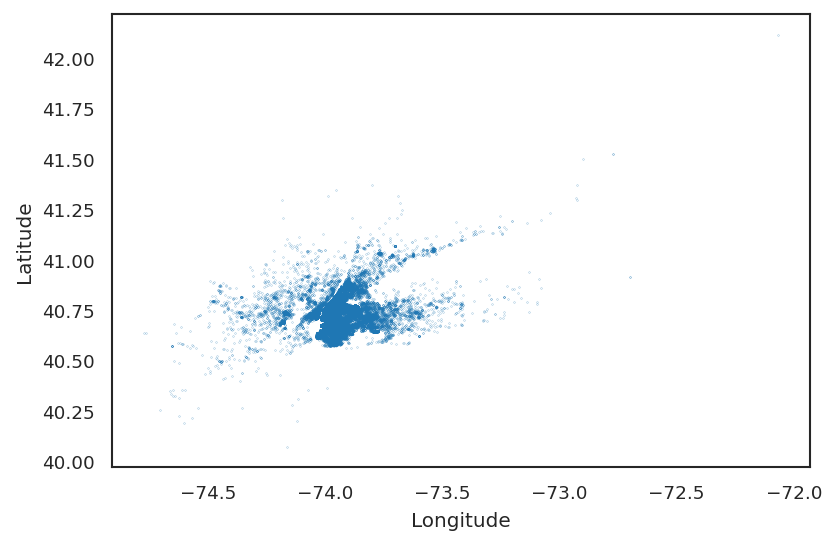

In [59]:
fig, ax = plt.subplots(dpi=150)
ax.scatter(loc_data.Lon, loc_data.Lat, s=0.01)
# ``s=0.01`` specifies the size. I am using a small size because
# these are too many points to visualize
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude');

This is nice, but it would be even nicer if we had a map of New York City on the background.
We can make such a map on [www.openstreetmap.org](https://www.openstreetmap.org/export#map=11/40.7855/-73.8964).
We just need to have a box of longitude's and latitudes that overlaps with our data.
Here is how to get such a *bounding box*:

In [60]:
box = ((loc_data.Lon.min(), loc_data.Lon.max(),
        loc_data.Lat.min(), loc_data.Lat.max()))
box

(-74.7733, -72.0666, 40.0729, 42.1166)

I have already extracted this picture for you and you can find it [here](https://github.com/PredictiveScienceLab/data-analytics-se/blob/master/homework/ny_map.png).
As always, it needs to be visible from the Jupyter notebook.
On Google Colab run:

In [61]:
url = 'https://github.com/PredictiveScienceLab/data-analytics-se/raw/master/homework/ny_map.png'
download(url)

If you have it at the right place, you should be able to see the image here:

![New York City Map](https://github.com/PredictiveScienceLab/data-analytics-se/blob/master/homework/ny_map.png?raw=1)

Now let's load the image as a matrix:

In [62]:
ny_map = plt.imread('ny_map.png')

And we can visualize it with ``plt.imshow`` and draw the Uber pickups on top of it.
Here is how:

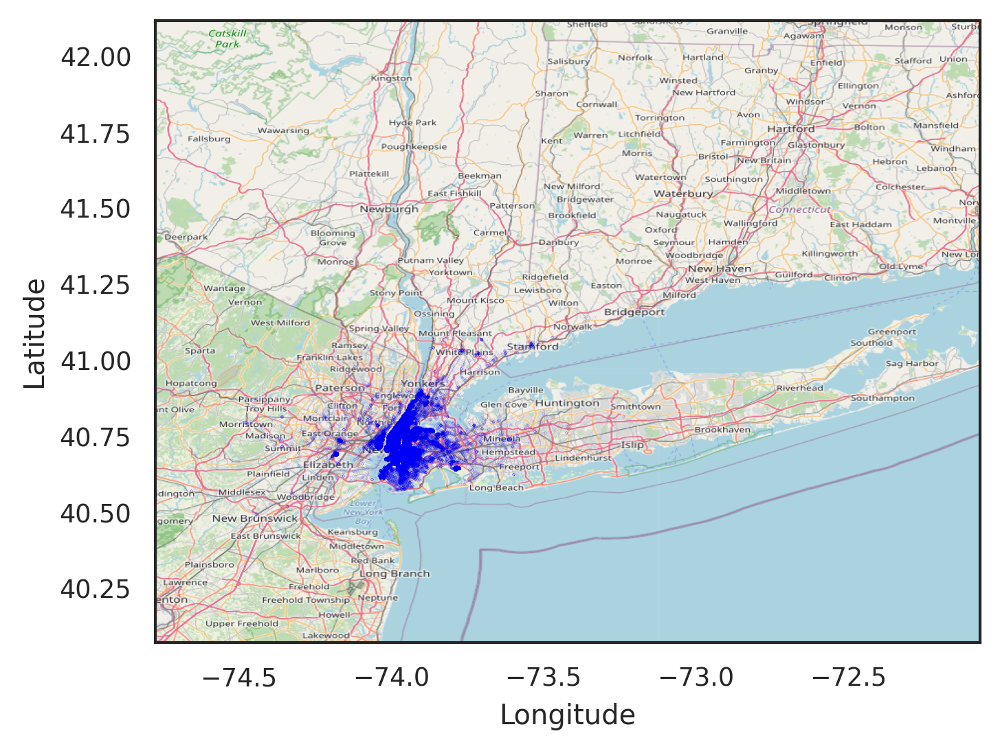

In [63]:
fig, ax = plt.subplots(dpi=300)
ax.scatter(loc_data.Lon, loc_data.Lat, zorder=1, alpha= 0.5, c='b', s=0.001)
ax.set_xlim(box[0],box[1])
ax.set_ylim(box[2],box[3])
ax.imshow(ny_map, zorder=0, extent=box, aspect= 'equal')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude');

Because we have over half a million data points, machine learning algorithms may be a bit slow.
So, as you develop your code use use only 50K observations.
Once you have a stable version of your code, modify the following code segment to make use of the entire dataset.

In [64]:
# While your are developing your code use this:
p1_train_data = loc_data[:50000]
# When you have a stable code, use this:
# p1_train_data = loc_data

## Part A - Splitting New York City into Subregions

Suppose that you are assigned the task of splitting New York City into operating subregions with pretty much equal demand.
When a pickup is requested in each subregion only the drivers in that region are called.
Note that this can quickly become a very difficult problem very quickly.
We are not looking for the best possible answer here.
This would require posing and solving a suitable optimization problem.
We are looking for a data-informed solution that is compatible with common sense.

Do (at least) the following:
+ Use Kmeans clustering on the pickup data with different number of clusters;
+ Visualize the labels of the clusters on the map using different colors (see the hands-on activities);
+ Visualize the centers of the discovered Kmeans clusters (in red color);
+ Use your common sense, e.g., make sure that you have enough clusters so that no region crosses the water (even if it is possible the drivers may have to pay tolls to cross). If it is impossible to get perfect results simply by Kmeans, feel free to ignore a small number of outliers as they could be handled manually;
+ Use [MiniBatchKMeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.MiniBatchKMeans.html#sklearn.cluster.MiniBatchKMeans) which is an much faster version of Kmeans suitable for large datasets (>10K observations);

Answer with as many text blocks and code blocks as you like right below.

In [65]:
# Your code here

In [66]:
p1_train_data=np.array(p1_train_data)

In [67]:
from sklearn.cluster import MiniBatchKMeans
model = MiniBatchKMeans(n_clusters=30).fit(p1_train_data)

In [68]:
model.cluster_centers_

array([[ 40.79413333, -73.97263889],
       [ 40.71423263, -74.01260526],
       [ 40.64975217, -73.77808696],
       [ 40.702724  , -74.178272  ],
       [ 40.75866632, -73.97241295],
       [ 40.76985714, -73.86665429],
       [ 40.71436667, -74.00182222],
       [ 40.6928    , -73.9237375 ],
       [ 40.73751704, -73.99341852],
       [ 40.73083333, -74.37106667],
       [ 40.88955   , -73.88695   ],
       [ 40.74279167, -74.006765  ],
       [ 40.75677158, -73.98948105],
       [ 40.85783333, -73.6125    ],
       [ 40.71609677, -73.95418065],
       [ 40.673124  , -73.958068  ],
       [ 40.77147841, -73.96067614],
       [ 40.8356    , -73.9289    ],
       [ 40.7514    , -73.92895714],
       [ 40.76946444, -73.98293111],
       [ 40.76508333, -73.96846667],
       [ 40.68082424, -73.98717273],
       [ 40.73812   , -73.98637   ],
       [ 40.74514   , -74.048544  ],
       [ 40.7494125 , -73.9935125 ],
       [ 40.72198308, -73.98583692],
       [ 40.74700236, -73.98297087],
 

In [69]:
model.labels_

array([16, 23, 22, ..., 10, 11, 19], dtype=int32)

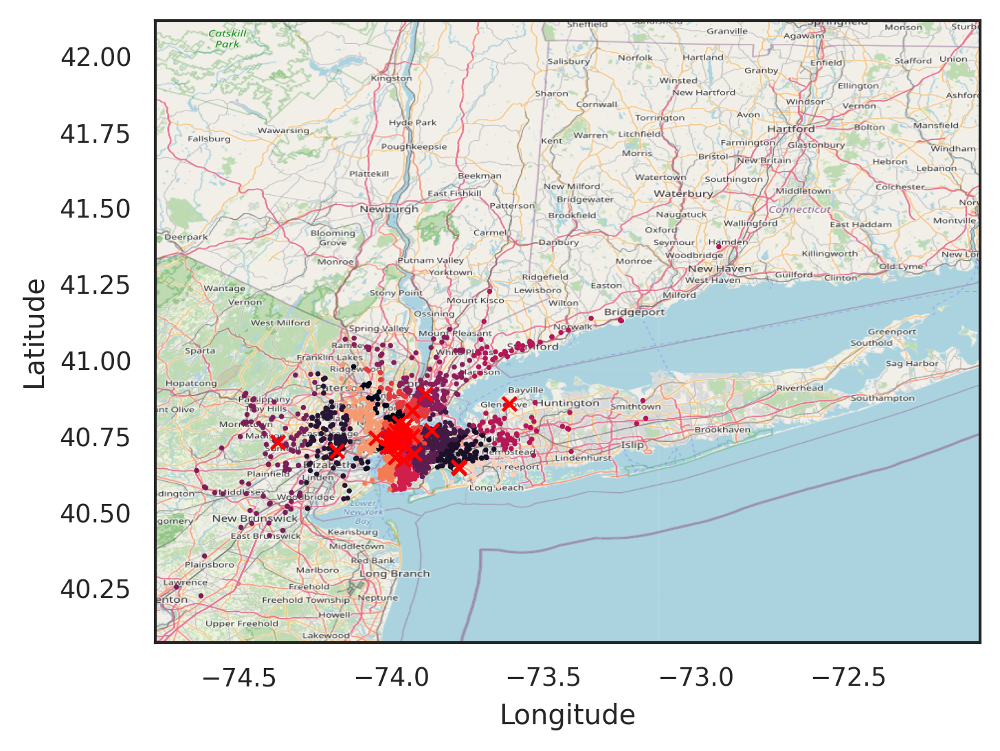

In [70]:
labels = model.predict(p1_train_data)
fig, ax = plt.subplots(dpi=300)
plt.scatter(p1_train_data[:,1], p1_train_data[:, 0],  c=labels, s=1)
plt.scatter(model.cluster_centers_[:,1], model.cluster_centers_[:, 0], c='r', marker='x')
ax.set_xlim(box[0],box[1])
ax.set_ylim(box[2],box[3])
ax.imshow(ny_map, zorder=0, extent=box, aspect= 'equal')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude');

## Part B - Create a Stochastic Model of Pickups

One of the key ingredients for a more sophisticated approach to optimizing the operations of Uber would involve the construction of a stochastic model of the demand for pickups.
The ideal model for this problem is the [Poisson Point Process](https://en.wikipedia.org/wiki/Poisson_point_process).
However, we are going to do something simpler, using the Gaussian mixture model and a Poisson random variable.
The model will not have a time component, but it will allow us to sample the number and locations of pickups during a typical month.
We will guide you through the process of constructing this model.

### Subpart B.I - Random variable capturing number of monthly pickups

Find the rate of monthly pickups (ignore the fact that months may differ by a few days) and use it to define a Poisson random variable corresponding to the monthly number of pickups.
Use ``scipy.stats.poisson`` to initialize this random variable. Sample from it 10,000 times and plot the histogram of the samples to get a feeling about the corresponding probability mass function.

In [71]:
# Your code here

In [72]:
random_data = np.random.poisson(lam=loc_data.shape[0], size=10000)

(array([4.42913386e-06, 4.37992126e-05, 1.81430446e-04, 4.12401575e-04,
        5.05741470e-04, 3.38418635e-04, 1.26312336e-04, 2.44422572e-05,
        2.95275591e-06, 4.92125984e-07]),
 array([561859. , 562468.6, 563078.2, 563687.8, 564297.4, 564907. ,
        565516.6, 566126.2, 566735.8, 567345.4, 567955. ]),
 <a list of 10 Patch objects>)

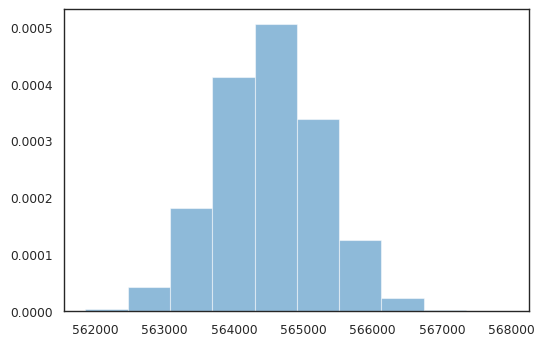

In [73]:
# Make synthetic dataset for clustering

fig, ax = plt.subplots(dpi=100)
ax.hist(random_data, alpha=0.5, density=True)

### Subpart B.II - Estimate the spatial density of pickups

Fit a Gaussian Mixture model to the pickup data.
**Do not use the Bayesian Information Criterion** to decide how many components to keep.
This would take quite a bit of time for this problem. Simply use 40 mixture components.
Plot the contour of the logarithm of the probability density on the New York City map.

In [74]:
# Your code here

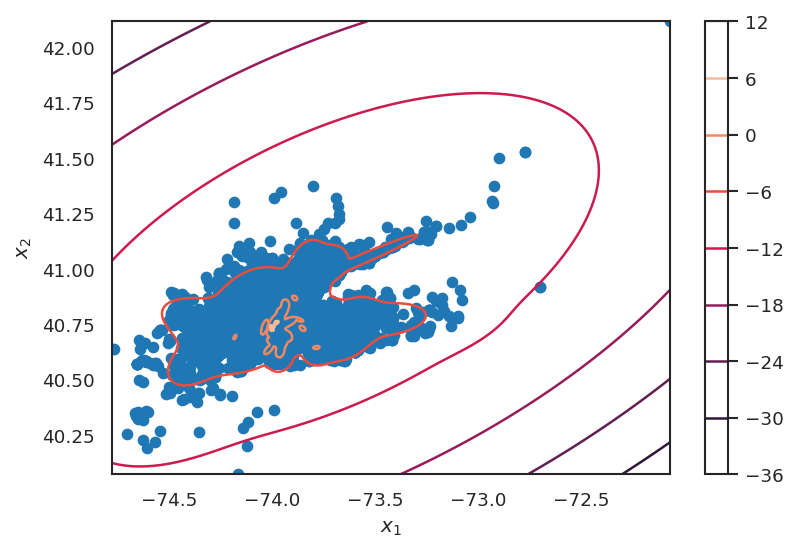

In [75]:
from sklearn.mixture import GaussianMixture
mix_model = GaussianMixture(n_components=40).fit(loc_data)

mix_means = mix_model.means_
mix_cov = mix_model.covariances_

# Pick a bunch of x points
x = np.linspace(box[0], box[1],1000)
# Pick a bunch of y points
y = np.linspace(box[2],box[3],1000)
# Make a grid (X and Y are 1000 x 1000 matrices. 
# The coordinates of the i, j grid point Are X[i, j], Y[i, j]
X, Y = np.meshgrid(x, y)
# Put the grid coordinates in a (1000^2) x 2 array because this is what scikit likes
XX = np.array([Y.ravel(), X.ravel()]).T
# Get the log probability on the grid points
z = mix_model.score_samples(XX)
# Reshape z 
Z = z.reshape(X.shape)


fig, ax = plt.subplots(dpi=150)
c = ax.contour(X, Y, Z)
plt.colorbar(c)
plt.scatter(loc_data.Lon, loc_data.Lat)
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$');

### Subpart B.III - Sample some random months of pickups

Now that you have a model that gives you the number of pickups and a model that allows you to sample a pickup location, sample five different datasets (number of pickups and location of each pick) from the combined model and visualize them on the New York map.

**Hint:** Don't get obsessed with making the model perfect. It's okay if a few of the pickups are on water...

In [76]:
# Your code here

# Problem 2 - Counting Celestial Objects

Consider [this picture](https://github.com/PredictiveScienceLab/data-analytics-se/raw/master/datasets/galaxies.png) of a patch of sky taken by the [Hubble Space Telescope](https://www.nasa.gov/mission_pages/hubble/story/index.html):

In [109]:
url = 'https://github.com/apple70831/12345/raw/apple70831-patch-2/111.jpg'
download(url)

![galaxies](https://github.com/PredictiveScienceLab/data-analytics-se/blob/master/homework/galaxies.png?raw=1)

This picture includes many galaxies, but also some starts.
We are going to create a machine learning model capable of counting the number of objects in such images.
Our model is not going to be able to differentiate between the different types of objects, and it will not be very accurate, but it does form the basis of more sophisticated approaches.
The idea is as follows:
+ Convert the picture to points sampled according to the intensity of light.
+ Apply Gaussian mixture on the resulting points.
+ Use the Bayesian Information Criterion to identify the number of components in the picture.
+ Associate the number of components with the actual number of celestial objects.

I will set you up with the first step. You will have to do the last three.

We are going to load the image with the [Python Imaging Library (PIL)](https://en.wikipedia.org/wiki/Python_Imaging_Library) which allows us to apply a few basic transformations to the image:

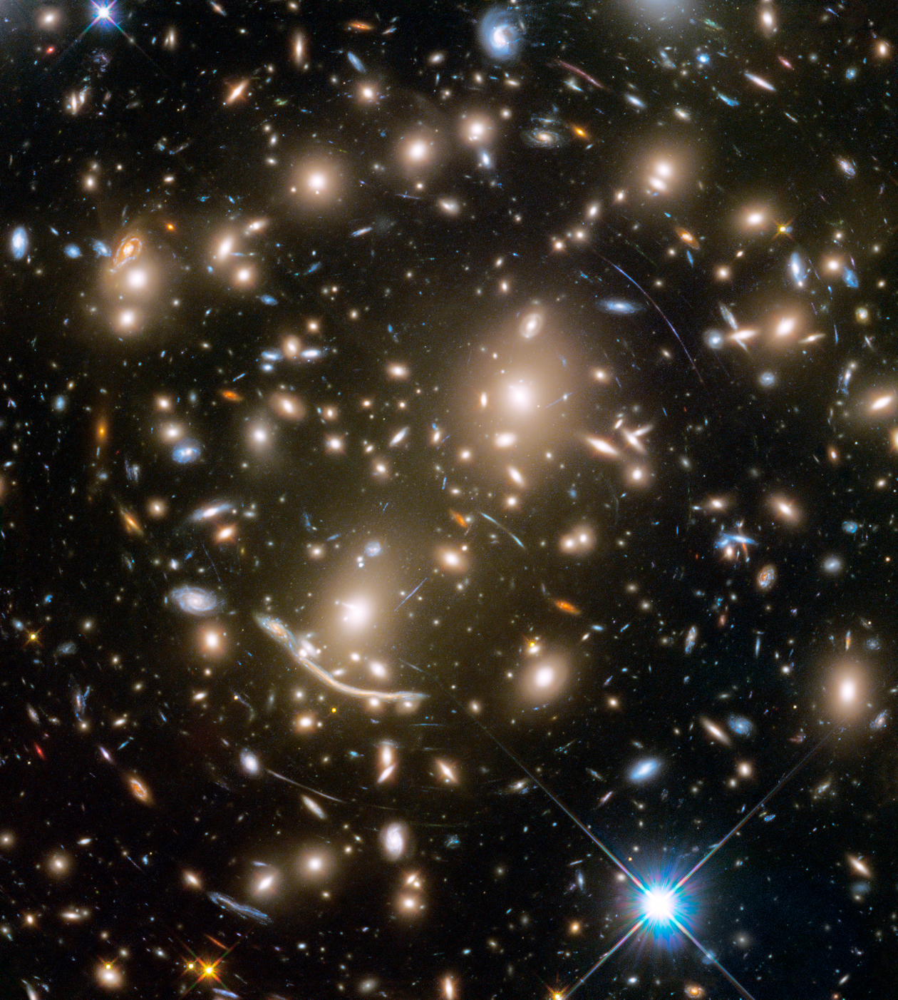

In [79]:
from PIL import Image
hubble_image = Image.open('galaxies.png')
# here is how to see the image
hubble_image

Now we are going to convert it to gray scale and crop it to make the problem a little bit easier:

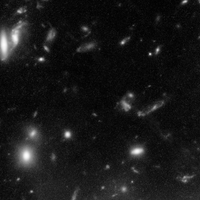

In [80]:
img = hubble_image.convert('L').crop((100, 100, 300, 300))
img

Remember that black-and white images are matrices:

In [81]:
img_ar = np.array(img)
img_ar

array([[ 7, 11, 11, ..., 28, 62, 88],
       [12, 12, 11, ..., 29, 47, 86],
       [18, 13, 11, ..., 24, 34, 87],
       ...,
       [24, 12, 15, ..., 43, 47, 40],
       [23, 12, 19, ..., 48, 49, 40],
       [18, 18, 23, ..., 50, 49, 41]], dtype=uint8)

The minimum number if $0$ corresponding to black and the maximum number is 255 corresponding to white.
Anything in between is some shade of gray.

Now, imagine that each pixel is associated with some cordinates.
Without loss of generality, let's assume that each pixel is some coordinate in $[0,1]^2$.
We will loop over each of the pixels and sample its coordinates in a way that increases with increasing light intensity.
To achieve this, we will pass the intensity values of each pixels through a sigmoid with parameters that can be tuned.
Here is this sigmoid:

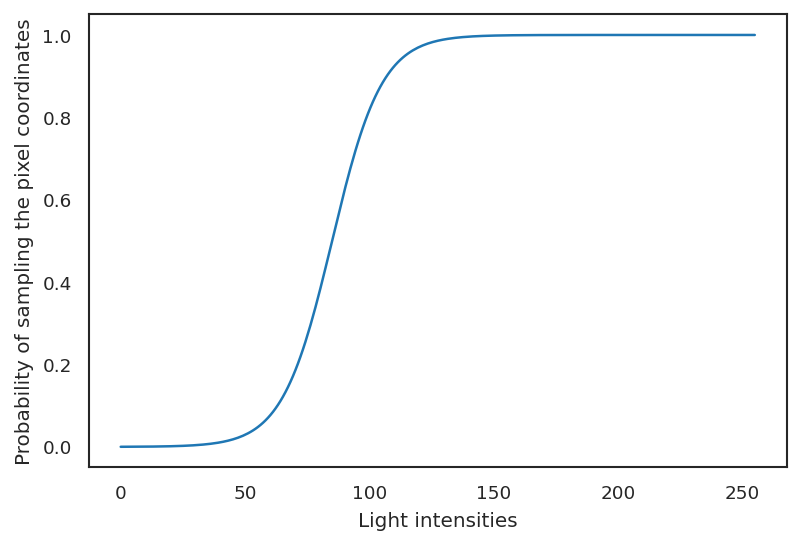

In [82]:
intensities = np.linspace(0, 255, 255)
fig, ax = plt.subplots(dpi=150)
alpha = 0.1
beta = 255 / 3
ax.plot(intensities, 1.0 / (1.0 + np.exp(-alpha * (intensities - beta))));
ax.set_xlabel('Light intensities')
ax.set_ylabel('Probability of sampling the pixel coordinates');

And here is the code that samples the pixel coordinates.
I am organizing it into a function because we may want to use it with different pictures:

In [83]:
def sample_pixel_coords(img, alpha, beta):
    """
    Samples pixel coordinates based on a probability defined as the sigmoid of the intensity.
    
    Arguments:
    
        img    -     The gray scale pixture from which we sample as an array
        alpha     -     The scale of the sigmoid
        beta      -     The offset of the sigmoid
    """
    img_ar = np.array(img)
    x = np.linspace(0, 1, img_ar.shape[0])
    y = np.linspace(0, 1, img_ar.shape[1])
    X, Y = np.meshgrid(x, y)
    img_to_locs = []
    # Loop over pixels
    for i in range(img_ar.shape[1]):
        for j in range(img_ar.shape[0]):
            # Calculate the probability of the pixel by looking at each
            # light intensity
            prob = 1.0 / (1.0 + np.exp(-alpha * (img_ar[j, i] - beta)))
            # Pick a uniform random number
            u = np.random.rand()
            # If u is smaller than the desired probability,
            # the consider the coordinates of the pixel sampled
            if u <= prob:
                img_to_locs.append((Y[i, j], X[-i-1, -j-1]))
    # Turn img_to_locs into a numpy array
    img_to_locs = np.array(img_to_locs)
    return img_to_locs

Let's test the code:

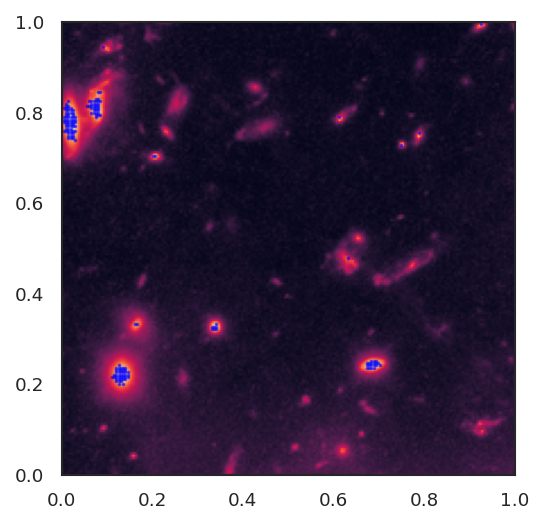

In [84]:
locs = sample_pixel_coords(img, alpha=0.1, beta=200)
fig, ax = plt.subplots(dpi=150)
ax.imshow(img, extent=((0, 1, 0, 1)), zorder=0)
ax.scatter(locs[:, 0], locs[:, 1], zorder=1, alpha=0.5, c='b', s=1);

Note that by playing with $\alpha$ and $\beta$ you can make the whole thing more or less sensitive to the light intensity.

In [85]:
from sklearn.mixture import GaussianMixture

def count_objs(img, alpha, beta, nc_min=1, nc_max=50):
    """
    Counts objects in image.
    
    Arguments:
        img       -     The image
        alpha     -     The scale of the sigmoid
        beta      -     The offset of the sigmoid
        nc_min    -     The minimum number of components to consider
        nc_max    -     The maximum number of components to consider
    """
    locs = sample_pixel_coords(img, alpha, beta)
    # Use BIC to search for the best GaussianMixture model
    bics = []
    models = []
    for nc in range(1,50):
        m = GaussianMixture(n_components=nc).fit(locs)
        bics.append(m.bic(locs))
        models.append(m)
    best_nc = bics.index(min(bics))
    bics = np.array(bics)
    # with components between nc_min and nc_max 
    # Set the following variables
    #best_nc = NotImplemented('Set this equal to the number of components of the best model.')\
    best_model = models[np.argmin(bics)]
    #best_model = NotImplemented('Set this equatl to the best model.')
    return best_nc, best_model, locs

Once you have completed the code, try it out the following images.
Feel free to play with $\alpha$ and $\beta$ to improve the performance.
**Do not try to make a perfect model. To do so, we would have to go beyond the Gaussian mixture model. This is just a homework problem.**

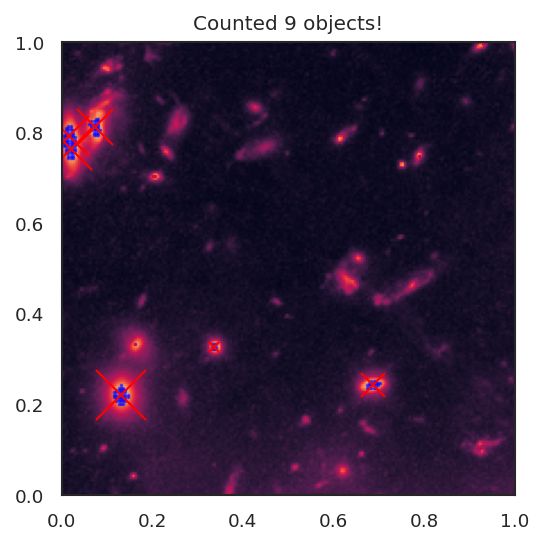

In [86]:
objs, model, locs = count_objs(img, alpha=2.0, beta=200)
fig, ax = plt.subplots(dpi=150)
ax.imshow(img, extent=((0, 1, 0, 1)))
for i in range(model.means_.shape[0]):
    ax.plot(model.means_[i, 0], model.means_[i, 1], 'rx', 
            markersize=10.0 * model.weights_.shape[0] * model.weights_[i])
ax.scatter(locs[:, 0], locs[:, 1], zorder=1, alpha=0.5, c='b', s=1)
ax.set_title('Counted {0:d} objects!'.format(objs));

Try this one:

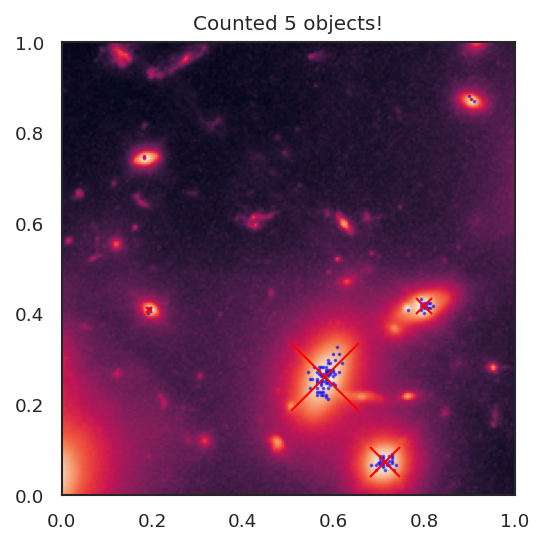

In [87]:
img = hubble_image.convert('L').crop((200, 200, 400, 400))
objs, model, locs = count_objs(img, alpha=.1, beta=250)
fig, ax = plt.subplots(dpi=150)
ax.imshow(img, extent=((0, 1, 0, 1)))
for i in range(model.means_.shape[0]):
    ax.plot(model.means_[i, 0], model.means_[i, 1], 'rx', 
            markersize=10.0 * model.weights_.shape[0] * model.weights_[i])
ax.scatter(locs[:, 0], locs[:, 1], zorder=1, alpha=0.5, c='b', s=1)
ax.set_title('Counted {0:d} objects!'.format(objs));

And try this one:

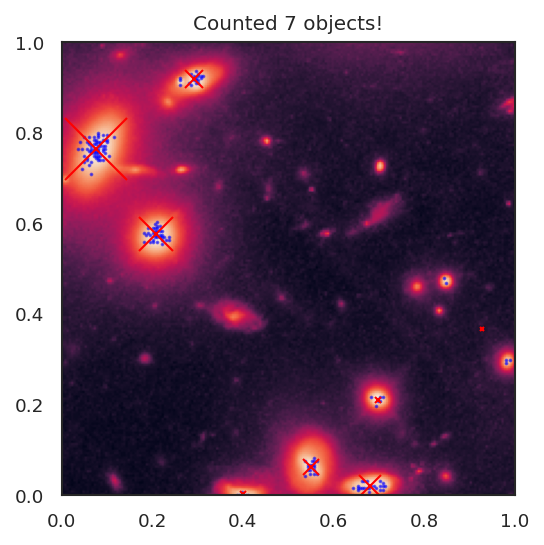

In [88]:
img = hubble_image.convert('L').crop((300, 300, 500, 500))
objs, model, locs = count_objs(img, alpha=.1, beta=250)
fig, ax = plt.subplots(dpi=150)
ax.imshow(img, extent=((0, 1, 0, 1)))
for i in range(model.means_.shape[0]):
    ax.plot(model.means_[i, 0], model.means_[i, 1], 'rx', 
            markersize=10.0 * model.weights_.shape[0] * model.weights_[i])
ax.scatter(locs[:, 0], locs[:, 1], zorder=1, alpha=0.5, c='b', s=1)
ax.set_title('Counted {0:d} objects!'.format(objs));

# Problem 3 - Quantifying Uncertainties in Steel Magnetic Properties

The magnetic properties of steel are captured in the so called [$B-H$ curve](https://en.wikipedia.org/wiki/Saturation_(magnetic)) which connects the magnetic field $H$ to the magnetic flux density $B$.
The shape of this curve depends on the manufacturing process of the steel. As a result the $B-H$ differs across different suppliers but alos across time for the same supplier.

Let's use some real manufacturer data to visualize these differences.
The data are [here](https://github.com/PredictiveScienceLab/data-analytics-se/raw/master/homework/B_data.csv).
Start by downloading the data:

In [89]:
url = 'https://github.com/PredictiveScienceLab/data-analytics-se/raw/master/homework/B_data.csv'
download(url)

Let's load and visualize the data:

In [ ]:
bh_data = np.loadtxt('B_data.csv')
fig, ax = plt.subplots(dpi=150)
ax.plot(bh_data.T, 'r', lw=0.1)
ax.set_xlabel('Index $j$')
ax.set_ylabel('$B$ (T)');

The dimensions of tha data are:

In [90]:
bh_data.shape

(200, 1500)

In [91]:
bh_data

array([[0.        , 0.00490631, 0.01913362, ..., 1.79321352, 1.79337681,
        1.79354006],
       [0.        , 0.00360282, 0.01426636, ..., 1.8367998 , 1.83697627,
        1.83715271],
       [0.        , 0.00365133, 0.01433438, ..., 1.77555287, 1.77570402,
        1.77585514],
       ...,
       [0.        , 0.00289346, 0.01154411, ..., 1.7668308 , 1.76697657,
        1.76712232],
       [0.        , 0.00809884, 0.03108513, ..., 1.7774044 , 1.77756225,
        1.77772007],
       [0.        , 0.00349638, 0.0139246 , ..., 1.76460358, 1.76474439,
        1.76488516]])

This, we have 200 observations of B-H curves each one consists of 1,500 dimensions.
Our goal is to build a stochastic model of B-H curves.
We did the same thing in Problem 5 of Homework 2.
Now we are going to do it better since we are going to use Principal Component Analysis to reduce the dimensionality of the data.
Do the following:
+ Use PCA to reduce the dimensionality of the data. Make sure that you follow the same routine we followed in the hands-on activity
    - separate into training and validation datasets
    - perform PCA on the training dataset
    - visualize the explained variance as a function of the number of components and figure out how many components you need to keep so that you capture 98% of the variance of the data
    - visualize the mean and the first three eigenvectors
    - visualize the reconstruction error on some points of the validation set and make sure that you have enough PCA components so that it is negligible
    - do the scatter plot of the two first principal components of the training data
    - use a Gaussian mixture model to find the density of the principal components you get (use the BIC to determine the number of Gaussian mixture components)
    
Once you have done all the above, demonstrate the resulting stochastic model by sampling from it 10 times, i.e., sample from the mixture the principal components, reconstruct the 1,500 dimensional vector of B's, and plot it as a curve.

In [92]:
# Your code and text here

In [93]:
# Import tensorflow
import tensorflow as tf
from sklearn.model_selection import train_test_split
rng = np.random.RandomState(0)
bh_train, bh_valid= train_test_split (bh_data, test_size=0.3, random_state=rng)
print(bh_train.shape, bh_valid.shape)

(140, 1500) (60, 1500)


In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=0.98, whiten=True).fit(bh_train)
print("Number of component to capture 98% of the variance of the data =", pca.n_components_)
fig, ax = plt.subplots(dpi=100)
ax.plot(pca.explained_variance_)
ax.set_xlabel('$i$')
ax.set_ylabel(r'$\lambda_i$');

Mean = [0.         0.00386745 0.01523821 ... 1.78501435 1.78516952 1.78532467]


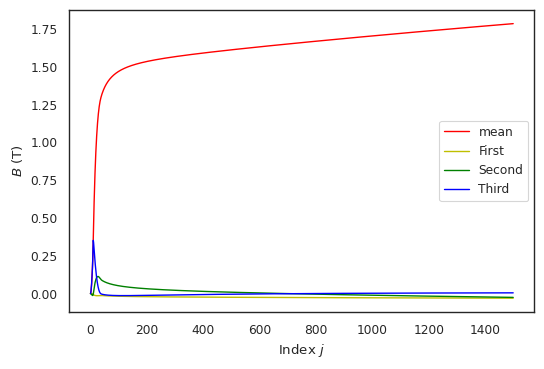

In [94]:
print("Mean =",pca.mean_)
fig, ax = plt.subplots(dpi=100)
ax.plot(pca.mean_, 'r', lw=1, label='mean' )
ax.plot(pca.components_[0,:], 'y', lw=1, label='First' )
ax.plot(pca.components_[1,:], 'g', lw=1, label='Second' )
ax.plot(pca.components_[2,:], 'b', lw=1, label='Third' )
ax.set_xlabel('Index $j$')
ax.set_ylabel('$B$ (T)');
ax.legend()

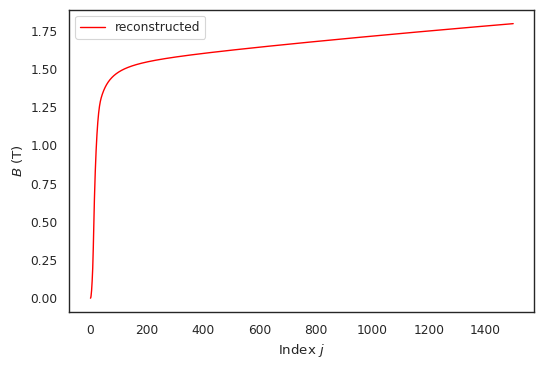

In [95]:
Z_valid = pca.transform(bh_valid)
# Which validation example would you like to look at:
idx = 1
n_components = 3

x = pca.inverse_transform(
    np.hstack([Z_valid[idx][:n_components], 
               np.zeros((Z_valid.shape[1] - n_components,))]))
fig, ax = plt.subplots(dpi=100)
ax.plot(x, 'r', lw=1, label='reconstructed' )
ax.set_xlabel('Index $j$')
ax.set_ylabel('$B$ (T)');
ax.legend()

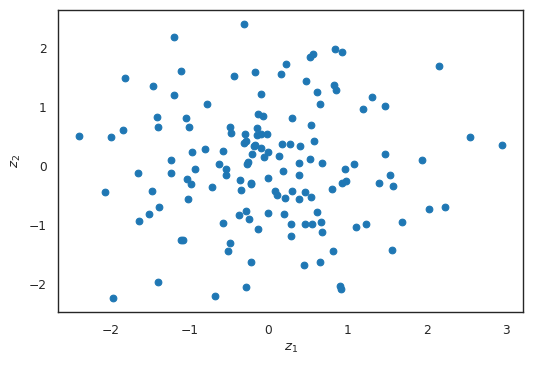

In [96]:
Z = pca.transform(bh_train)
fig, ax = plt.subplots(dpi=100)
ax.scatter(Z[:, 0], Z[:, 1])
ax.set_xlabel('$z_1$')
ax.set_ylabel('$z_2$');

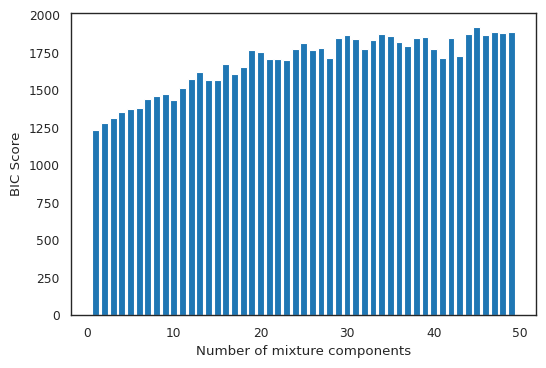

In [97]:
from sklearn.mixture import GaussianMixture
# The principal components:
Z = pca.transform(bh_train)
# Train with different number of mixture components and estimate BIC
bics = []
models = []
for nmc in range(1,50):
    m = GaussianMixture(n_components=nmc).fit(Z)
    bics.append(m.bic(Z))
    models.append(m)
bics = np.array(bics)

fig, ax = plt.subplots(dpi=100)
ax.bar(range(1, 50), bics)
ax.set_ylabel('BIC Score')
ax.set_xlabel('Number of mixture components');

1


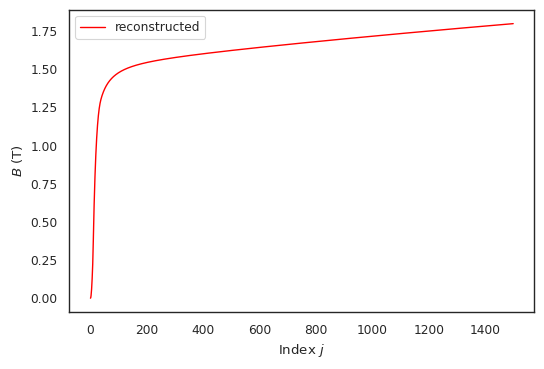

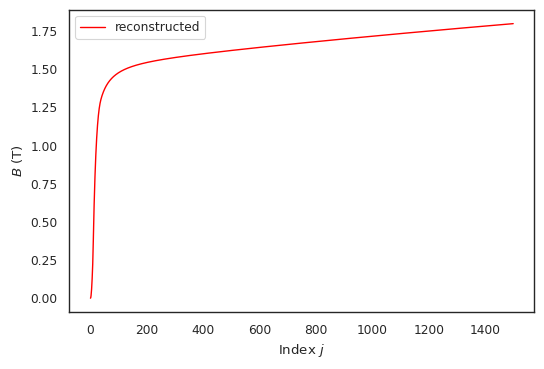

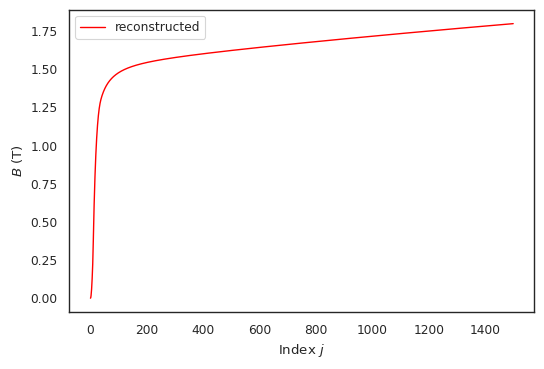

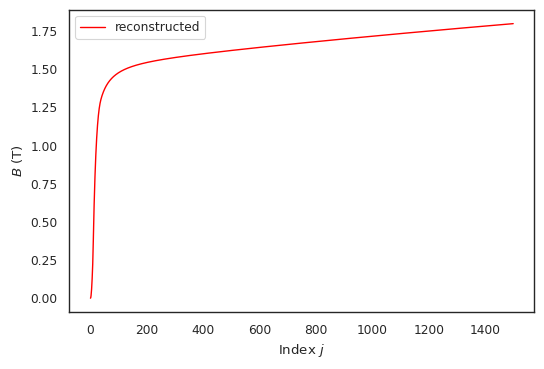

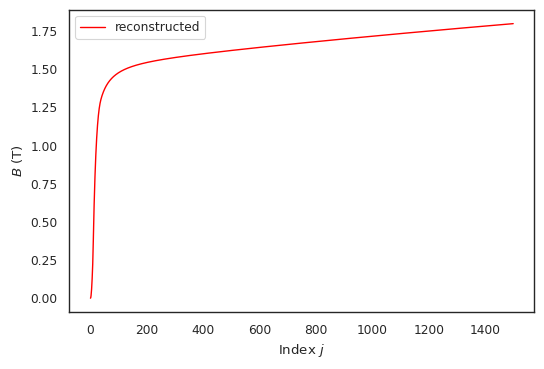

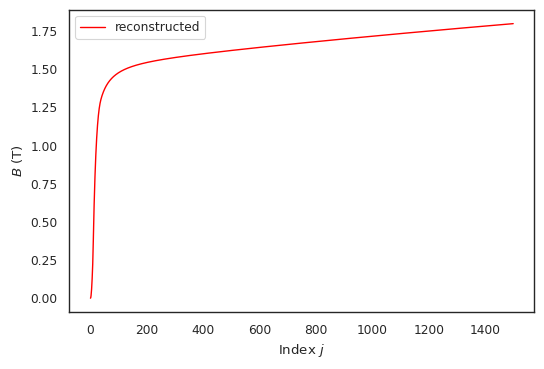

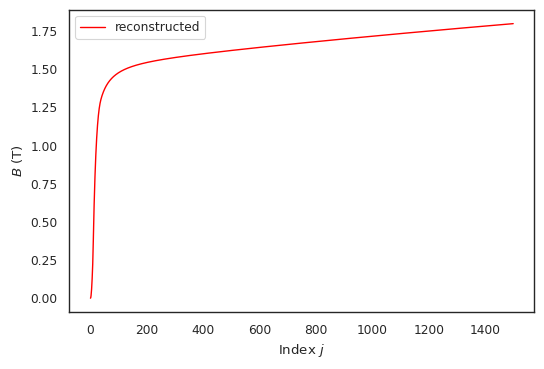

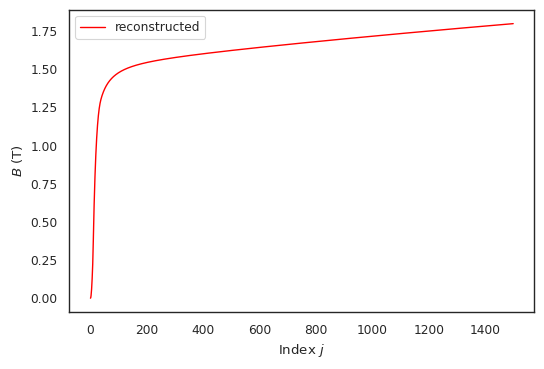

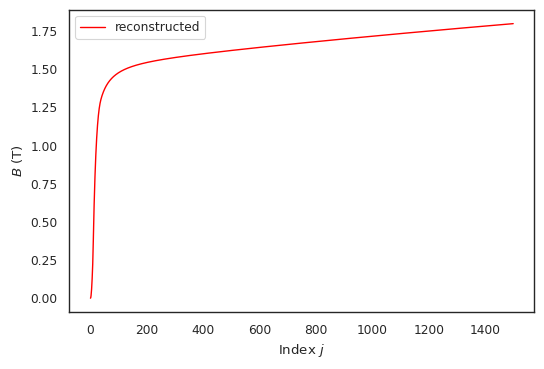

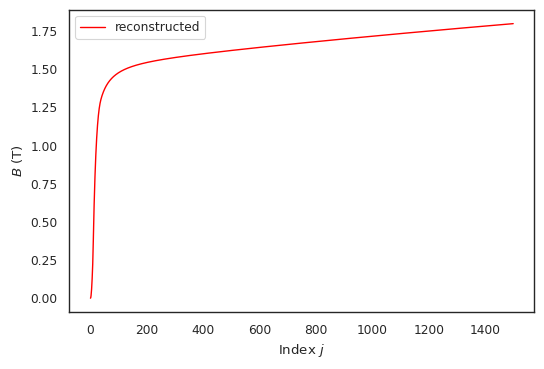

In [98]:

best_nc = 1
print(best_nc)
best_model = GaussianMixture(n_components = best_nc).fit(bh_train)

idx = 1
n_components = 1

for i in range(10):
    z = best_model.sample()[0]
    x = x = pca.inverse_transform(
    np.hstack([Z_valid[idx][:n_components], 
               np.zeros((Z_valid.shape[1] - n_components,))]))
    fig, ax = plt.subplots(dpi=100)
    ax.plot(x, 'r', lw=1, label='reconstructed' )
    ax.set_xlabel('Index $j$')
    ax.set_ylabel('$B$ (T)');
    ax.legend()